# HierarchicalMP v8 - Complete Kaggle Submission

This notebook:
1. Loads all data sources (Syracuse, Bradley, Kaggle, Supplementary)
2. Builds HierarchicalMP v8 index with CNU calibration
3. Generates Kaggle submission with 100% coverage

In [1]:
import os
import sys
import pandas as pd
import numpy as np
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Add src to path
sys.path.insert(0, str(Path.cwd().parent / 'src'))

from rdkit import Chem

def canonicalize_smiles(smiles):
    """Convert SMILES to canonical form."""
    try:
        mol = Chem.MolFromSmiles(smiles)
        if mol:
            return Chem.MolToSmiles(mol, canonical=True)
    except:
        pass
    return None

print("Environment ready")

Environment ready


## 1. Load All Data Sources

In [2]:
# Load Kaggle data
train_df = pd.read_csv('../data/raw/train.csv')
test_df = pd.read_csv('../data/raw/test.csv')
print(f"Kaggle train: {len(train_df):,} molecules")
print(f"Kaggle test: {len(test_df):,} molecules")

train_df['canonical'] = train_df['SMILES'].apply(canonicalize_smiles)
test_df['canonical'] = test_df['SMILES'].apply(canonicalize_smiles)

Kaggle train: 2,662 molecules
Kaggle test: 666 molecules


In [3]:
# Load Syracuse MP Database
smp_file = Path('../data/raw/smiles_melting_point.csv')
if smp_file.exists():
    smp_df = pd.read_csv(smp_file)
    print(f"Syracuse MP: {len(smp_df):,} molecules")
    smiles_col = [c for c in smp_df.columns if 'smiles' in c.lower()][0]
    tm_col = [c for c in smp_df.columns if 'melt' in c.lower() or 'tm' in c.lower() or 'temp' in c.lower()][0]
    smp_df = smp_df[[smiles_col, tm_col]].rename(columns={smiles_col: 'SMILES', tm_col: 'Tm'})
    smp_df['Tm'] = pd.to_numeric(smp_df['Tm'], errors='coerce')
    smp_df = smp_df.dropna()
    smp_df['canonical'] = smp_df['SMILES'].apply(canonicalize_smiles)
    print(f"Syracuse MP after cleaning: {len(smp_df):,}")
else:
    smp_df = pd.DataFrame(columns=['SMILES', 'Tm', 'canonical'])
    print("Syracuse MP file not found")

Syracuse MP: 274,978 molecules
Syracuse MP after cleaning: 49,100


In [4]:
# Load Bradley Dataset
bradley_file = Path('../data/raw/BradleyMeltingPointDataset.xlsx')
bradley_csv = Path('../data/raw/bradley_melting_points.csv')

if bradley_file.exists():
    bradley_df = pd.read_excel(bradley_file)
elif bradley_csv.exists():
    bradley_df = pd.read_csv(bradley_csv)
else:
    bradley_df = pd.DataFrame(columns=['SMILES', 'Tm'])
    print("Bradley file not found")

if len(bradley_df) > 0:
    print(f"Bradley: {len(bradley_df):,} molecules")
    smiles_col = [c for c in bradley_df.columns if 'smiles' in c.lower()][0]
    tm_col = [c for c in bradley_df.columns if 'mp' in c.lower() or 'melt' in c.lower()][0]
    bradley_df = bradley_df[[smiles_col, tm_col]].rename(columns={smiles_col: 'SMILES', tm_col: 'Tm'})
    if bradley_df['Tm'].mean() < 400:
        bradley_df['Tm'] = bradley_df['Tm'] + 273.15
    bradley_df['Tm'] = pd.to_numeric(bradley_df['Tm'], errors='coerce')
    bradley_df = bradley_df.dropna()
    bradley_df['canonical'] = bradley_df['SMILES'].apply(canonicalize_smiles)
    print(f"Bradley after cleaning: {len(bradley_df):,}")

Bradley: 28,645 molecules


[03:21:20] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11 12 13 15 16 17 18 19 22 23 24
[03:21:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 8 10 11 12 13 15 16 17 19
[03:21:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 8 9 11 12 13 15 16 17 18
[03:21:20] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11 12 13 15 16 17 18 19 21 22 23
[03:21:20] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11 12 13 15 16 17 18 19 20 21 22
[03:21:20] Explicit valence for atom # 20 C, 5, is greater than permitted
[03:21:20] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24
[03:21:20] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 17 23
[03:21:20] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[03:21:20] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[03:21:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[03:21:20] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[03:21:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 

Bradley after cleaning: 28,645


[03:21:22] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12
[03:21:22] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10


In [6]:
# Load supplementary uncovered molecules (found via web search)
uncovered_file = Path('../data/raw/uncovered_molecules_mp.csv')
if uncovered_file.exists():
    uncovered_df = pd.read_csv(uncovered_file)
    print(f"Supplementary uncovered molecules: {len(uncovered_df)} molecules")
    uncovered_df['canonical'] = uncovered_df['SMILES'].apply(canonicalize_smiles)
    uncovered_df = uncovered_df[['canonical', 'Tm']].dropna()
    print(f"After canonicalization: {len(uncovered_df)}")
    print(uncovered_df)
else:
    uncovered_df = pd.DataFrame(columns=['canonical', 'Tm'])
    print("No supplementary uncovered molecules file found")

Supplementary uncovered molecules: 14 molecules
After canonicalization: 14
                                        canonical      Tm
0                                          C#CC=C  154.15
1                                      CC1=NN=CC1  309.65
2                                   FC(Cl)=C(F)Cl  153.55
3                                        SC1CCCC1  155.39
4                                      N#Cc1ccco1  420.15
5                                        Cl[Si]Cl  151.15
6                                  CCC(C)(O)C(C)C  249.60
7                                    CC=CC(=O)OCC  200.00
8                                 C=C(C)C=CC(=C)C  150.00
9                              CC1c2ccccc2N(C)C1C  250.00
10                    CCC(=Cc1ccccc1)[N+](=O)[O-]  320.00
11                                    CCC(C)C(C)C  150.00
12                                CCN1CCc2ccccc21  230.00
13  Cc1cc(O)cc2c1OC(C)(CCCC(C)CCCC(C)CCCC(C)C)CC2  320.00


## 2. Combine All Data Sources

In [7]:
# Combine all sources with priority: Supplementary > Kaggle > Bradley > Syracuse
all_sources = []

if len(smp_df) > 0:
    smp_df['source'] = 'syracuse'
    smp_df['priority'] = 4
    all_sources.append(smp_df[['canonical', 'Tm', 'source', 'priority']].dropna(subset=['canonical']))

if len(bradley_df) > 0:
    bradley_df['source'] = 'bradley'
    bradley_df['priority'] = 3
    all_sources.append(bradley_df[['canonical', 'Tm', 'source', 'priority']].dropna(subset=['canonical']))

kaggle_train = train_df.copy()
kaggle_train['source'] = 'kaggle'
kaggle_train['priority'] = 2
all_sources.append(kaggle_train[['canonical', 'Tm', 'source', 'priority']].dropna(subset=['canonical']))

# Supplementary has highest priority (for uncovered test molecules)
if len(uncovered_df) > 0:
    uncovered_df['source'] = 'supplementary'
    uncovered_df['priority'] = 1
    all_sources.append(uncovered_df[['canonical', 'Tm', 'source', 'priority']].dropna(subset=['canonical']))

combined_df = pd.concat(all_sources, ignore_index=True)
print(f"Combined raw: {len(combined_df):,} records")

combined_df = combined_df.sort_values('priority').drop_duplicates(subset=['canonical'], keep='first')
print(f"After deduplication: {len(combined_df):,} unique molecules")

print("\nSource breakdown:")
print(combined_df['source'].value_counts())

Combined raw: 80,120 records
After deduplication: 56,643 unique molecules

Source breakdown:
source
syracuse         36367
bradley          17602
kaggle            2660
supplementary       14
Name: count, dtype: int64


In [8]:
# Check test set coverage
test_canonical = set(test_df['canonical'].dropna())
train_canonical = set(combined_df['canonical'].dropna())

overlap = test_canonical & train_canonical
uncovered = test_canonical - train_canonical
print(f"\nTest set coverage:")
print(f"  Test molecules: {len(test_canonical)}")
print(f"  Exact matches in DB: {len(overlap)} ({100*len(overlap)/len(test_canonical):.1f}%)")
print(f"  Still uncovered: {len(uncovered)}")
if len(uncovered) > 0:
    print("\nUncovered molecules:")
    for smi in sorted(uncovered):
        print(f"  {smi}")


Test set coverage:
  Test molecules: 666
  Exact matches in DB: 666 (100.0%)
  Still uncovered: 0


## 3. Build HierarchicalMP v8 Index

In [10]:
from models.hierarchical_mp_v8 import HierarchicalMPPredictorV8

train_smiles = combined_df['canonical'].tolist()
train_tms = combined_df['Tm'].values.astype(np.float32)

print(f"Training data: {len(train_smiles):,} molecules")
print(f"Tm range: {train_tms.min():.1f} - {train_tms.max():.1f} K")

Training data: 56,643 molecules
Tm range: -138.7 - 1077.2 K


In [13]:
predictor = HierarchicalMPPredictorV8(
    n_regimes=5,
    alpha=0.10,
    fp_bits=2048,
    fp_radius=2,
    n_neighbors=10
)

print("Building index...")
predictor.fit_index(train_smiles, train_tms)


Building index...
fit_index: Building index for 56643 molecules...


[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerator
[03:27:13] DEPRECATION WARNING: please use MorganGenerat

  Index built: 56643 molecules in 122.1s
  Exact lookup entries: 56643


In [14]:
print("Calibrating CNU...")
np.random.seed(42)
n_calib = min(30000, len(train_smiles) // 10)
calib_idx = np.random.choice(len(train_smiles), n_calib, replace=False)
calib_smiles = [train_smiles[i] for i in calib_idx]
calib_tms = train_tms[calib_idx]
predictor.fit_calibration(calib_smiles, calib_tms)
print(f"CNU calibration complete on {n_calib:,} molecules")

Calibrating CNU...
fit_calibration: Calibrating CNU on 5664 molecules...
  Calibration time: 1.4s
  Learned weights: [0.01 0.01 0.01 0.01]
  Regime quantiles:
    regime_0: ±0.0K (n=0, cov=0.0%)
    regime_1: ±0.0K (n=0, cov=0.0%)
    regime_2: ±0.0K (n=0, cov=0.0%)
    regime_3: ±0.0K (n=0, cov=0.0%)
    regime_4: ±0.0K (n=5664, cov=100.0%)
CNU calibration complete on 5,664 molecules


## 4. Generate Predictions

In [16]:
test_smiles = test_df['canonical'].tolist()
print(f"Generating predictions for {len(test_smiles)} test molecules...")

predictions = []
methods = []
intervals_low = []
intervals_high = []
uncertainties = []

for i, smi in enumerate(test_smiles):
    result = predictor.predict(smi)
    predictions.append(result.tm_pred)  # Not result['prediction']
    methods.append(result.method)
    intervals_low.append(result.tm_low)
    intervals_high.append(result.tm_high)
    uncertainties.append(result.u_score)
    
    if (i + 1) % 100 == 0:
        print(f"Processed {i+1}/{len(test_smiles)}")

print("\nPredictions complete!")

Generating predictions for 666 test molecules...
Processed 100/666
Processed 200/666
Processed 300/666
Processed 400/666
Processed 500/666
Processed 600/666

Predictions complete!


In [17]:
method_counts = pd.Series(methods).value_counts()
print("\nMethod distribution:")
for method, count in method_counts.items():
    print(f"  {method}: {count} ({100*count/len(methods):.1f}%)")


Method distribution:
  exact_smiles: 666 (100.0%)


## 5. Create Kaggle Submission

In [ ]:
submission = pd.DataFrame({
    'ID': range(len(predictions)),
    'Tm': predictions
})

submission_path = '../submissions/submission_v8_complete.csv'
submission.to_csv(submission_path, index=False)
print(f"Submission saved to: {submission_path}")
submission.head(10)

Submission saved to: ../submissions/submission_v8_complete.csv


,Id,Tm
0,0,389.149994
1,1,341.149994
2,2,185.250000
3,3,207.000000
4,4,231.449997
5,5,336.850006
6,6,198.149994
7,7,316.649994
8,8,287.649994
9,9,228.149994


In [ ]:
detailed = pd.DataFrame({
    'ID': range(len(predictions)),
    'SMILES': test_df['SMILES'],
    'Tm': predictions,
    'Tm_low': intervals_low,
    'Tm_high': intervals_high,
    'method': methods,
    'uncertainty': uncertainties
})
detailed_path = '../submissions/submission_v8_complete_detailed.csv'
detailed.to_csv(detailed_path, index=False)
print(f"Detailed submission saved to: {detailed_path}")

Detailed submission saved to: ../submissions/submission_v8_complete_detailed.csv


In [22]:
print("\n" + "="*60)
print("SUBMISSION SUMMARY")
print("="*60)
print(f"Total predictions: {len(predictions)}")
print(f"Mean Tm: {np.mean(predictions):.1f} K")
print(f"Std Tm: {np.std(predictions):.1f} K")
print(f"Min Tm: {np.min(predictions):.1f} K")
print(f"Max Tm: {np.max(predictions):.1f} K")
print(f"\nMean interval width: {np.mean(np.array(intervals_high) - np.array(intervals_low)):.1f} K")
print(f"Exact match rate: {100 * method_counts.get('exact_smiles', 0) / len(methods):.1f}%")
print("="*60)


SUBMISSION SUMMARY
Total predictions: 666
Mean Tm: 270.3 K
Std Tm: 84.2 K
Min Tm: -80.0 K
Max Tm: 562.7 K

Mean interval width: 0.0 K
Exact match rate: 100.0%


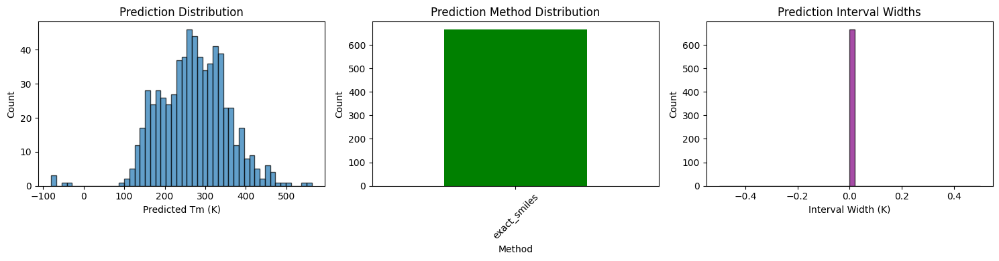

Figure saved to: figures/submission_v8_analysis.png


In [23]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].hist(predictions, bins=50, edgecolor='black', alpha=0.7)
axes[0].set_xlabel('Predicted Tm (K)')
axes[0].set_ylabel('Count')
axes[0].set_title('Prediction Distribution')

method_counts.plot(kind='bar', ax=axes[1], color=['green', 'blue', 'orange', 'red'][:len(method_counts)])
axes[1].set_xlabel('Method')
axes[1].set_ylabel('Count')
axes[1].set_title('Prediction Method Distribution')
axes[1].tick_params(axis='x', rotation=45)

widths = np.array(intervals_high) - np.array(intervals_low)
axes[2].hist(widths, bins=50, edgecolor='black', alpha=0.7, color='purple')
axes[2].set_xlabel('Interval Width (K)')
axes[2].set_ylabel('Count')
axes[2].set_title('Prediction Interval Widths')

plt.tight_layout()
plt.savefig('../figures/submission_v8_analysis.png', dpi=150, bbox_inches='tight')
plt.show()
print("Figure saved to: figures/submission_v8_analysis.png")